In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('attacks.csv', encoding='latin1', index_col=0)
display(df)

,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,...,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
Case Number,,,,,,,,,,,,,,,,,,,,,
2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,57,...,White shark,"R. Collier, GSAF",2018.06.25-Wolfe.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.25,2018.06.25,6303.0,NaN,NaN
2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,11,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0,NaN,NaN
2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,48,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0,NaN,NaN
2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,NaN,...,2 m shark,"B. Myatt, GSAF",2018.06.08-Arrawarra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.08,2018.06.08,6300.0,NaN,NaN
2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,NaN,...,"Tiger shark, 3m",A .Kipper,2018.06.04-Ramos.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.04,2018.06.04,6299.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
df1 = pd.read_csv('list_coor_australia.csv', encoding='latin1', index_col=0)
display(df1)

,134.755
-24.7761086,
-30.373991,152.719210
-33.981733,151.179549
-33.540220,115.040110
-31.952712,115.860480
-10.578646,142.218921
...,...
-33.865990,151.205810
-33.639526,115.025959
-24.722397,152.113001


In [4]:
#Evaluation of the structure of the dataframes

df.shape, df.dtypes

((25723, 23),
 Date                       object
 Year                      float64
 Type                       object
 Country                    object
 Area                       object
 Location                   object
 Activity                   object
 Name                       object
 Sex                        object
 Age                        object
 Injury                     object
 Fatal (Y/N)                object
 Time                       object
 Species                    object
 Investigator or Source     object
 pdf                        object
 href formula               object
 href                       object
 Case Number.1              object
 Case Number.2              object
 original order            float64
 Unnamed: 22                object
 Unnamed: 23                object
 dtype: object)

In [8]:
df1.shape, df1.dtypes

((593, 1),
 134.755    float64
 dtype: object)

In [27]:
#Most of the first dataframe is composed with object even if we can see that case Number 1 and 2 are numerical in the dataframe.
#The seconf dataframe is composed of floats which is normal considering that we have coordinates

In [9]:
df_na = df.isna().sum()
df_na.sort_values(ascending=False)

Unnamed: 22               25722
Unnamed: 23               25721
Time                      22775
Species                   22259
Age                       22252
Sex                       19986
Activity                  19965
Location                  19961
Fatal (Y/N)               19960
Area                      19876
Name                      19631
Country                   19471
Injury                    19449
Investigator or Source    19438
Type                      19425
Year                      19423
href formula              19422
pdf                       19421
href                      19421
Case Number.1             19421
Case Number.2             19421
Date                      19421
original order            19414
dtype: int64

In [32]:
#We can see here that most of the data is missing from the first dataframe (19414 out of 25723 rows -> 75,4% of the dataset). 
#Some columns have all their values empty, which means that we have to remove them.

In [10]:
df1.isna().sum()

134.755    0
dtype: int64

In [11]:
#I copy the dataframe before any change

df_copy = df.copy()

display(df_copy)

,Date,Year,Type,Country,Area,Location,Activity,Name,Sex,Age,...,Species,Investigator or Source,pdf,href formula,href,Case Number.1,Case Number.2,original order,Unnamed: 22,Unnamed: 23
Case Number,,,,,,,,,,,,,,,,,,,,,
2018.06.25,25-Jun-2018,2018.0,Boating,USA,California,"Oceanside, San Diego County",Paddling,Julie Wolfe,F,57,...,White shark,"R. Collier, GSAF",2018.06.25-Wolfe.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.25,2018.06.25,6303.0,NaN,NaN
2018.06.18,18-Jun-2018,2018.0,Unprovoked,USA,Georgia,"St. Simon Island, Glynn County",Standing,Adyson McNeely,F,11,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.18-McNeely.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.18,2018.06.18,6302.0,NaN,NaN
2018.06.09,09-Jun-2018,2018.0,Invalid,USA,Hawaii,"Habush, Oahu",Surfing,John Denges,M,48,...,NaN,"K.McMurray, TrackingSharks.com",2018.06.09-Denges.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.09,2018.06.09,6301.0,NaN,NaN
2018.06.08,08-Jun-2018,2018.0,Unprovoked,AUSTRALIA,New South Wales,Arrawarra Headland,Surfing,male,M,NaN,...,2 m shark,"B. Myatt, GSAF",2018.06.08-Arrawarra.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.08,2018.06.08,6300.0,NaN,NaN
2018.06.04,04-Jun-2018,2018.0,Provoked,MEXICO,Colima,La Ticla,Free diving,Gustavo Ramos,M,NaN,...,"Tiger shark, 3m",A .Kipper,2018.06.04-Ramos.pdf,http://sharkattackfile.net/spreadsheets/pdf_di...,http://sharkattackfile.net/spreadsheets/pdf_di...,2018.06.04,2018.06.04,6299.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
#cleaning of the empty rows

Columns_to_removed = ["Investigator or Source", "pdf", "href formula", "href", "Name", "Sex ", "Case Number.1", "Case Number.2", "original order", "Year", "Location", "Age", "Type", "Species ", "Time", "Unnamed: 22", "Unnamed: 23"]
df2 = df_copy.drop(Columns_to_removed, axis=1)
display(df2)

,Date,Country,Area,Activity,Injury,Fatal (Y/N)
Case Number,,,,,,
2018.06.25,25-Jun-2018,USA,California,Paddling,"No injury to occupant, outrigger canoe and pad...",N
2018.06.18,18-Jun-2018,USA,Georgia,Standing,Minor injury to left thigh,N
2018.06.09,09-Jun-2018,USA,Hawaii,Surfing,Injury to left lower leg from surfboard skeg,N
2018.06.08,08-Jun-2018,AUSTRALIA,New South Wales,Surfing,Minor injury to lower leg,N
2018.06.04,04-Jun-2018,MEXICO,Colima,Free diving,Lacerations to leg & hand shark PROVOKED INCIDENT,N
...,...,...,...,...,...,...
NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN
NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
df2.isna().sum()
display(df2.isna().sum().sort_values(ascending=False))

Activity       19965
Fatal (Y/N)    19960
Area           19876
Country        19471
Injury         19449
Date           19421
dtype: int64

In [43]:
df3 = df2.dropna(how='all').copy()
display(df3.isna().sum())

Date             0
Country         50
Area           455
Activity       544
Injury          28
Fatal (Y/N)    539
dtype: int64

In [44]:
df3.shape

(6302, 6)

In [45]:
df3["Fatal (Y/N)"].value_counts()

N          4293
Y          1388
UNKNOWN      71
 N            7
M             1
2017          1
N             1
y             1
Name: Fatal (Y/N), dtype: int64

In [111]:
# Convert all values in capital
df3["Fatal (Y/N)"] = df3["Fatal (Y/N)"].str.upper()

#Remove white space
df3["Fatal (Y/N)"] = df3["Fatal (Y/N)"].str.strip()

# Replace all values except Y and N by empty cell
df3["Fatal (Y/N)"] = df3["Fatal (Y/N)"].replace(["UNKNOWN", " ", "M", "2017"], "")

# display
df3["Fatal (Y/N)"].value_counts()

N    4301
Y    1389
       73
Name: Fatal (Y/N), dtype: int64

In [112]:
#Clean activities 

#Display Counts
df3["Injury"].value_counts()



INJURY NO DETAILS    2325
FATAL INJURY         1452
OTHER                1008
NO INJURY             812
SEVERE INJURY         394
MINOR INJURY          311
Name: Injury, dtype: int64

In [244]:
#categorizes the activities in the DataFrame df3 into specific groups based on certain keywords. 
#Iterates over each row, checks the activity value, and assigns a corresponding category based on 
#the presence of specific words in the activity string.

pd.set_option("display.max_rows", None)       
        
for index, row in df3.iterrows():
    injury = row["Injury"]
    if isinstance(injury, str) and any(word in injury.upper() for word in ["FATAL", "MURDERED", "FATAL INJURY"]):
        df3.at[index, "Injury"] = "FATAL INJURY"
    elif isinstance(injury, str) and any(word in injury.upper() for word in ["NO INJURY", "NO INURY"]):
        df3.at[index, "Injury"] = "NO INJURY"
    elif isinstance(injury, str) and any(word in injury.upper() for word in ["SEVERE", "MAJOR", "AMPUTATED"]):
        df3.at[index, "Injury"] = "SEVERE INJURY"
    elif isinstance(injury, str) and any(word in injury.upper() for word in ["BITTEN", "LACERATED", "LACERATION", "LACERATIONS", "BITES", "BITE", "NIPPED", "MOLESTED", "LACERATING"]):
        df3.at[index, "Injury"] = "AVERAGE INJURY"
    elif isinstance(injury, str) and any(word in injury.upper() for word in ["MINOR", "SUPERFICIAL", "ABRADED", "ABRASION"]):
        df3.at[index, "Injury"] = "MINOR INJURY"   
    elif isinstance(injury, str) and "INJURY" in injury.upper():
        df3.at[index, "Injury"] = "INJURY NO DETAILS"
    else:
        df3.at[index, "Injury"] = "OTHER"



# Check if the "Fatal (Y/N)" column has a value of "Y"
fatal_mask = df3["Fatal (Y/N)"] == "Y"

# Replace the corresponding values in the "Injury" column
df3.loc[fatal_mask, "Injury"] = "FATAL INJURY"


df3["Injury"].value_counts()

INJURY NO DETAILS    2325
FATAL INJURY         1452
OTHER                1008
NO INJURY             812
SEVERE INJURY         394
MINOR INJURY          311
Name: Injury, dtype: int64

In [243]:
df3

,Date,Country,Area,Activity,Injury,Fatal (Y/N)
Case Number,,,,,,
2018.06.25,25-Jun-2018,USA,California,Paddling,NO INJURY,N
2018.06.18,18-Jun-2018,USA,Georgia,OTHER,MINOR INJURY,N
2018.06.09,09-Jun-2018,USA,Hawaii,Surfing,INJURY NO DETAILS,N
2018.06.08,08-Jun-2018,AUSTRALIA,New South Wales,Surfing,MINOR INJURY,N
2018.06.04,04-Jun-2018,MEXICO,Colima,Free diving,INJURY NO DETAILS,N
2018.06.03.b,03-Jun-2018,AUSTRALIA,New South Wales,Kite surfing,NO INJURY,N
2018.06.03.a,03-Jun-2018,BRAZIL,Pernambuco,Swimming,FATAL INJURY,Y
2018.05.27,27-May-2018,USA,Florida,Fishing,MINOR INJURY,N
2018.05.26.b,26-May-2018,USA,Florida,OTHER,INJURY NO DETAILS,N


In [204]:
# Remove lines with missing values in the key columns knowing that's categorical column
df4 = df3.dropna(subset=["Activity", "Injury"])

# Fill missing data with "N" after checking the data in the database we can say that when the column fatal is empty 
df4["Fatal (Y/N)"].fillna("N", inplace=True)

# Check again the missing values
display(df4.isna().sum())

Date             0
Country         43
Area           376
Activity         0
Injury           0
Fatal (Y/N)      0
dtype: int64

In [205]:
df4.shape
df4.dtypes

Date           object
Country        object
Area           object
Activity       object
Injury         object
Fatal (Y/N)    object
dtype: object

In [245]:
#categorizes countries into "low_countries" and "average_countries" based on their frequency counts in the dataset, 
#and then updates the values in the "Country" column accordingly.

country_counts = df4["Country"].value_counts()

low_countries = []
average_countries = []

for country, count in country_counts.items():
    if count < 10:
        low_countries.append(country)
    elif 10 <= count < 100:
        average_countries.append(country)

# iterate over each row of the DataFrame df4 and extract the index and row data to assign them to the variables index and row.

for index, row in df4.iterrows():
    country = row["Country"]
    if country in low_countries:
        df4.at[index, "Country"] = "LOW_COUNTRY"
    elif country in average_countries:
        df4.at[index, "Country"] = "AVERAGE_COUNTRY"

country_counts = df4["Country"].value_counts()
print(country_counts)


USA                 2095
AUSTRALIA           1214
AVERAGE_COUNTRY      981
SOUTH AFRICA         535
LOW_COUNTRY          451
NEW ZEALAND          120
PAPUA NEW GUINEA     112
BAHAMAS              104
BRAZIL               103
Name: Country, dtype: int64


In [207]:
df4["Activity"].value_counts()

Surfing                                                                                                                                                                                                                                                           971
OTHER                                                                                                                                                                                                                                                             884
Swimming                                                                                                                                                                                                                                                          869
Fishing                                                                                                                                                                                                               

In [208]:
pd.set_option("display.max_rows", None)

In [209]:
for index, row in df4.iterrows():
    activity = row["Activity"]
    if isinstance(activity, str) and any(word in activity.upper() for word in ["SURF", "SURFING"]):
        df4.at[index, "Activity"] = "Surfing"
    elif isinstance(activity, str) and any(word in activity.upper() for word in ["SWIM", "SWIMMING", "BATHING"]):
        df4.at[index, "Activity"] = "Swimming"
    elif isinstance(activity, str) and any(word in activity.upper() for word in ["DIVING", "DIVE", "SCUBA", "SNORKELING"]):
        df4.at[index, "Activity"] = "Diving"
    elif isinstance(activity, str) and any(word in activity.upper() for word in ["FISH", "FISHING", "SPEARFISHING", "WADE-FISHING"]):
        df4.at[index, "Activity"] = "Fishing"
    elif isinstance(activity, str) and any(word in activity.upper() for word in ["SAILING", "SAIL", "BOAT", "BOATING"]):
        df4.at[index, "Activity"] = "Boating"
    elif isinstance(activity, str) and any(word in activity.upper() for word in ["SURFING", "SURF", "BOARD", "PADDLE", "WINDSURF", "SURF-SKI", "PADDLESKIING", "PADDLING"]):
        df4.at[index, "Activity"] = "Boarding"
    elif isinstance(activity, str) and any(word in activity.upper() for word in ["KAYAK", "KAYAKING", "CANOEING", "CANOE"]):
        df4.at[index, "Activity"] = "Canoeing/Kayaking"
    elif isinstance(activity, str) and any(word in activity.upper() for word in ["PLAYING", "JUMPING", "JUMPED", "SPLASHING"]):
        df4.at[index, "Activity"] = "Playing"
    elif isinstance(activity, str) and any(word in activity.upper() for word in ["FLOATING", "FLOAT"]):
        df4.at[index, "Activity"] = "Floating"
    elif isinstance(activity, str) and any(word in activity.upper() for word in ["DISATER", "AIR DISASTER", "HURRICANE"]):
        df4.at[index, "Activity"] = "Disaster"
    else:
        df4.at[index, "Activity"] = "OTHER"

df4["Activity"].value_counts()

Swimming             1295
Surfing              1261
Fishing              1108
OTHER                 886
Diving                682
Boarding              271
Boating               111
Canoeing/Kayaking      57
Floating               46
Playing                41
Name: Activity, dtype: int64

In [210]:
df4

,Date,Country,Area,Activity,Injury,Fatal (Y/N)
Case Number,,,,,,
2018.06.25,25-Jun-2018,USA,California,Boarding,NO INJURY,N
2018.06.18,18-Jun-2018,USA,Georgia,OTHER,MINOR INJURY,N
2018.06.09,09-Jun-2018,USA,Hawaii,Surfing,INJURY NO DETAILS,N
2018.06.08,08-Jun-2018,AUSTRALIA,New South Wales,Surfing,MINOR INJURY,N
2018.06.04,04-Jun-2018,AVERAGE_COUNTRY,Colima,Diving,INJURY NO DETAILS,N
2018.06.03.b,03-Jun-2018,AUSTRALIA,New South Wales,Surfing,NO INJURY,N
2018.06.03.a,03-Jun-2018,BRAZIL,Pernambuco,Swimming,FATAL INJURY,Y
2018.05.27,27-May-2018,USA,Florida,Fishing,MINOR INJURY,N
2018.05.26.b,26-May-2018,USA,Florida,OTHER,INJURY NO DETAILS,N


In [211]:
df4.shape

(5758, 6)

In [212]:
df4.isna().sum()

Date             0
Country         43
Area           376
Activity         0
Injury           0
Fatal (Y/N)      0
dtype: int64

In [213]:
# Create new column for  months
df4['Month'] = pd.to_datetime(df4['Date'], errors='coerce').dt.month_name()

# Drop the original "Date" column
df4.drop('Date', axis=1, inplace=True)
df4.drop('Fatal (Y/N)', axis=1, inplace=True)

In [215]:
df4.drop('Area', axis=1, inplace=True)

In [216]:
# Display the updated dataframe
df4

,Country,Activity,Injury,Month
Case Number,,,,
2018.06.25,USA,Boarding,NO INJURY,June
2018.06.18,USA,OTHER,MINOR INJURY,June
2018.06.09,USA,Surfing,INJURY NO DETAILS,June
2018.06.08,AUSTRALIA,Surfing,MINOR INJURY,June
2018.06.04,AVERAGE_COUNTRY,Diving,INJURY NO DETAILS,June
2018.06.03.b,AUSTRALIA,Surfing,NO INJURY,June
2018.06.03.a,BRAZIL,Swimming,FATAL INJURY,June
2018.05.27,USA,Fishing,MINOR INJURY,May
2018.05.26.b,USA,OTHER,INJURY NO DETAILS,May


In [218]:
df4["Country"].value_counts()

USA                 2095
AUSTRALIA           1214
AVERAGE_COUNTRY      981
SOUTH AFRICA         535
LOW_COUNTRY          451
NEW ZEALAND          120
PAPUA NEW GUINEA     112
BAHAMAS              104
BRAZIL               103
Name: Country, dtype: int64

In [219]:
df4["Month"].value_counts()

January      649
July         550
August       505
September    462
June         419
October      384
April        374
December     359
March        350
November     340
May          329
February     326
Name: Month, dtype: int64

In [222]:
df4.isna().sum()

Country      43
Activity      0
Injury        0
Month       711
dtype: int64

In [223]:
df5 = df4.dropna(subset=["Month", "Country"])

In [224]:
df5.isna().sum()

Country     0
Activity    0
Injury      0
Month       0
dtype: int64

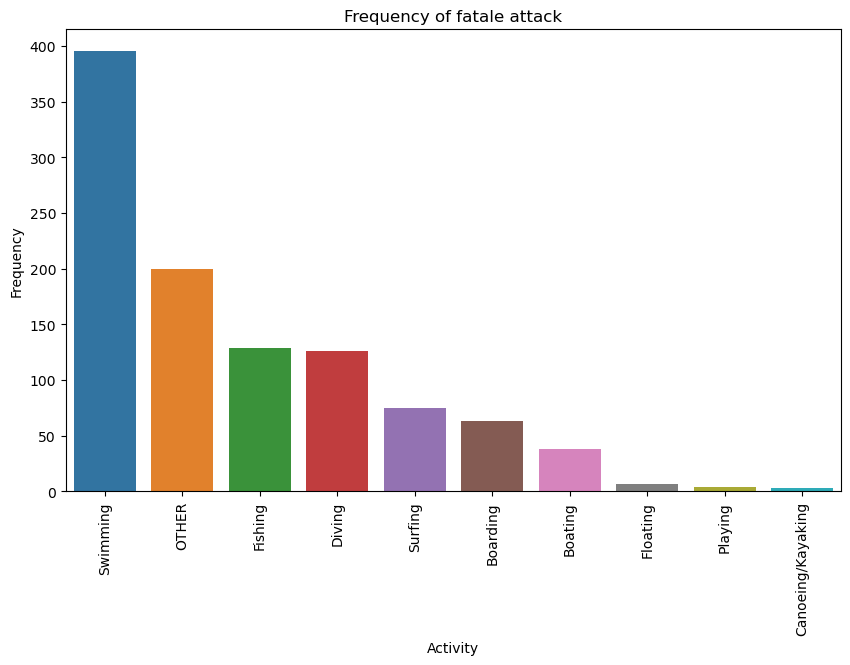

In [231]:
import seaborn as sns
import matplotlib.pyplot as plt

# Filter data on fatal injuries
df6 = df5[df5["Injury"] == "FATAL INJURY"]

# Count frequency of fatal injury per activity
activity_counts = df6["Activity"].value_counts()

# Create a barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=activity_counts.index, y=activity_counts.values)
plt.xlabel("Activity")
plt.ylabel("Frequency")
plt.title("Frequency of fatale attack")
plt.xticks(rotation=90)
plt.show()

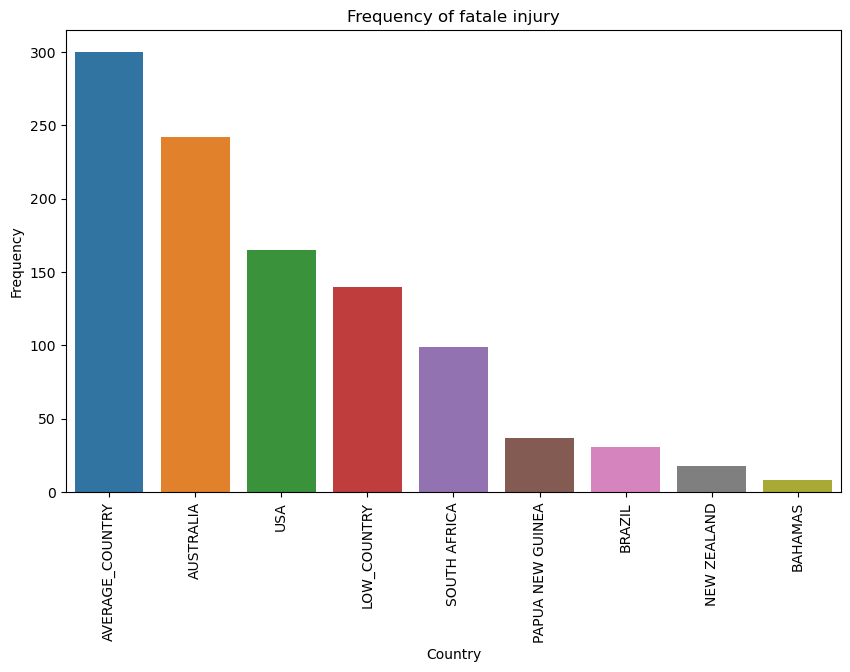

In [239]:
# Filter data on fatal injuries
df6 = df5[df5["Injury"] == "FATAL INJURY"]

# Count frequency of fatal injury per activity
country_counts = df6["Country"].value_counts()

# Create a barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=country_counts.index, y=country_counts.values)
plt.xlabel("Country")
plt.ylabel("Frequency")
plt.title("Frequency of fatale injury")
plt.xticks(rotation=90)
plt.show()

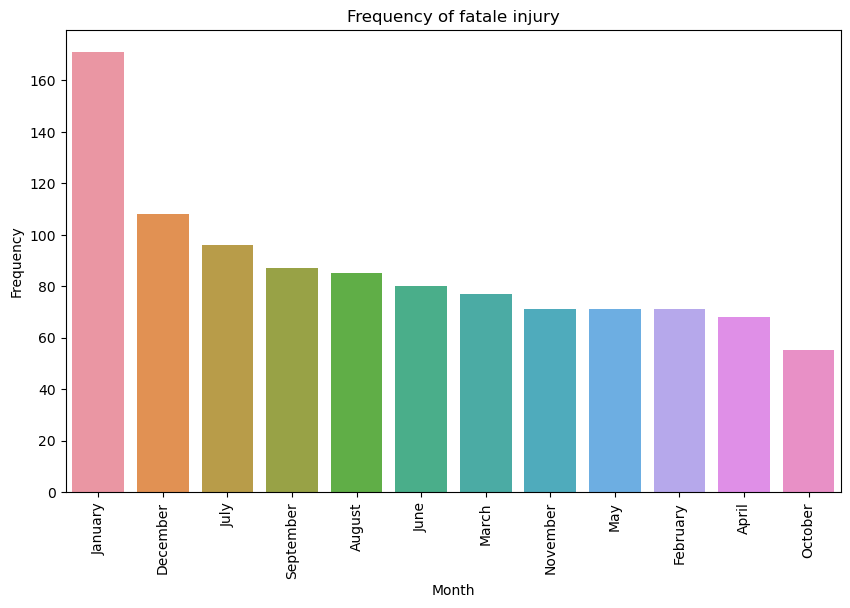

In [240]:
# Filter data on fatal injuries
df6 = df5[df5["Injury"] == "FATAL INJURY"]

# Count frequency of fatal injury per activity
month_counts = df6["Month"].value_counts()

# Create a barplot
plt.figure(figsize=(10, 6))
sns.barplot(x=month_counts.index, y=month_counts.values)
plt.xlabel("Month")
plt.ylabel("Frequency")
plt.title("Frequency of fatale injury")
plt.xticks(rotation=90)
plt.show()

In [232]:
df7 = pd.get_dummies(df6, drop_first=True)
df7

,Country_AVERAGE_COUNTRY,Country_BAHAMAS,Country_BRAZIL,Country_LOW_COUNTRY,Country_NEW ZEALAND,Country_PAPUA NEW GUINEA,Country_SOUTH AFRICA,Country_USA,Activity_Boating,Activity_Canoeing/Kayaking,...,Month_December,Month_February,Month_January,Month_July,Month_June,Month_March,Month_May,Month_November,Month_October,Month_September
Case Number,,,,,,,,,,,,,,,,,,,,,
2018.06.03.a,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2017.11.30.a,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2017.11.04,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
2017.10.01,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0
2017.09.15.b,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2017.09.03.b,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2017.05.06,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
2017.04.29.a,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2017.04.17.a,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
